# Classification of Dog and Cat using VGG16 and MobileNet CNN model

### Contents :
1. Import Libraries
2. Setting the test and train folders
3. Simple Convolutional Network and its prediction
4. CCN with VGG16 model
5. CNN with MobileNet model

In [1]:
#Importing libraries
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import itertools
%matplotlib inline
import mpld3
mpld3.enable_notebook()

In [2]:
#Importing Deep Learning Libraries
import keras
from keras import backend as K
from keras.models import Sequential
from keras.layers import Activation
from keras.layers.core import Dense,Flatten
from keras.optimizers import Adam
from keras.metrics import categorical_crossentropy
from keras.preprocessing.image import ImageDataGenerator
from keras.layers.normalization import BatchNormalization
from keras.layers.convolutional import *
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
from keras.models import Model
from keras.applications import imagenet_utils

Using TensorFlow backend.


In [3]:
train_path = 'dataset/training_set'
test_path = 'dataset/test_set'

In [71]:
train_batch = ImageDataGenerator().flow_from_directory(train_path,target_size=(224,224),classes=['dogs','cats'],batch_size=6)
test_batch = ImageDataGenerator().flow_from_directory(test_path,target_size=(224,224),classes=['dogs','cats'],batch_size=6)

Found 8000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.


In [5]:
# plots images with labels within jupyter notebook
def plots(ims, figsize=(12,6), rows=1, interp=False, titles=None):
    if type(ims[0]) is np.ndarray:
        ims = np.array(ims).astype(np.uint8)
        if (ims.shape[-1] != 3):
            ims = ims.transpose((0,2,3,1))
    f = plt.figure(figsize=figsize)
    cols = len(ims)//rows if len(ims) % 2 == 0 else len(ims)//rows + 1
    for i in range(len(ims)):
        sp = f.add_subplot(rows, cols, i+1)
        sp.axis('Off')
        if titles is not None:
            sp.set_title(titles[i], fontsize=16)
        plt.imshow(ims[i], interpolation=None if interp else 'none')

In [6]:
imgs,labels = next(train_batch)

C:\Users\Suyog\.conda\envs\deep_learning\lib\site-packages\matplotlib\text.py:1150: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


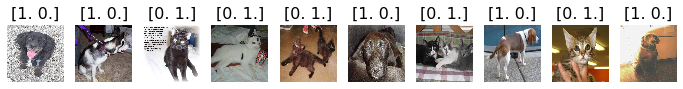

In [7]:
plots(imgs,titles=labels)

## Build Simple CNN

In [8]:
model = Sequential()

In [9]:
#First CNN
model.add(Conv2D(filters=32,kernel_size=(3,3),activation='relu',input_shape=train_batch.image_shape))

In [10]:
model.add(Flatten())

In [11]:
model.add(Dense(units=2,activation='softmax'))

In [12]:
model.compile(Adam(lr=0.001),loss='categorical_crossentropy',metrics=['accuracy'])

In [13]:
model.fit_generator(train_batch,steps_per_epoch=4,validation_data=test_batch,validation_steps=4,epochs=5)

Epoch 1/5
4/4 [==============================] - 3s 753ms/step - loss: 13116.7714 - accuracy: 0.5250 - val_loss: 6120.1880 - val_accuracy: 0.6000
Epoch 2/5
4/4 [==============================] - 2s 475ms/step - loss: 8588.5377 - accuracy: 0.5000 - val_loss: 1462.0637 - val_accuracy: 0.4000
Epoch 3/5
4/4 [==============================] - 2s 540ms/step - loss: 4386.3099 - accuracy: 0.5750 - val_loss: 5374.4268 - val_accuracy: 0.6000
Epoch 4/5
4/4 [==============================] - 2s 520ms/step - loss: 2174.6956 - accuracy: 0.5250 - val_loss: 2022.2649 - val_accuracy: 0.4500
Epoch 5/5
4/4 [==============================] - 2s 570ms/step - loss: 2362.9109 - accuracy: 0.4750 - val_loss: 417.2831 - val_accuracy: 0.4500


## Prediction from our Simple CNN

In [14]:
test_imgs,test_labels = next(test_batch)

In [15]:
test_labels =test_labels[:,0]

In [16]:
test_labels

array([1., 0., 1., 1., 1., 1., 0., 1., 1., 0.], dtype=float32)

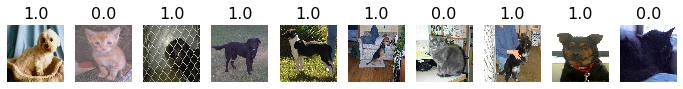

In [17]:
plots(test_imgs,titles=test_labels)

In [18]:
predictions = model.predict_generator(test_batch,steps=1)

In [19]:
import pandas as pd
pred = pd.DataFrame(predictions[:,0])

In [20]:
pred

,0
0,0.0
1,0.0
2,0.0
3,0.0
4,1.0
5,0.0
6,0.0
7,0.0
8,0.0
9,0.0


In [21]:
pred1 = np.where(pred > 0.5, 1,0)

In [22]:
pred1

array([[0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0]])

In [23]:
cm = confusion_matrix(test_labels,pred1)

In [24]:
cm

array([[3, 0],
       [6, 1]], dtype=int64)

In [25]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]),   range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
                
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [26]:
cm = confusion_matrix(test_labels,predictions.argmax(axis=1))

In [27]:
cm

array([[0, 3],
       [1, 6]], dtype=int64)

In [28]:
test_batch.class_indices

{'dogs': 0, 'cats': 1}

In [29]:
cm_plot_labels=['cat','dog']

Confusion matrix, without normalization
[[0 3]
 [1 6]]


TypeError: Object of type ndarray is not JSON serializable

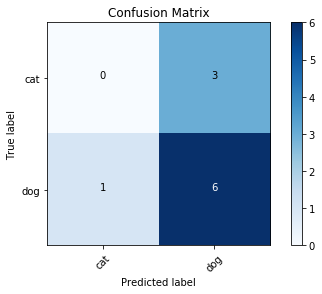

In [30]:
plot_confusion_matrix(cm,cm_plot_labels,title='Confusion Matrix')

## Build Fine Tuned VGG16 model

In [31]:
vgg16_model = keras.applications.vgg16.VGG16()

In [32]:
vgg16_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [33]:
type(vgg16_model)

keras.engine.training.Model

In [34]:
model = Sequential()

In [35]:
for layer in vgg16_model.layers:
    model.add(layer)

In [36]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)      

In [37]:
model._layers.pop()

In [38]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)      

In [39]:
for layer in model.layers:
    layer.trainable=False

In [40]:
model.add(Dense(2,activation='softmax'))

In [41]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)      

## Train the fine-tuned VGG16 model

In [46]:
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [47]:
model.fit_generator(train_batch,steps_per_epoch=4,validation_data=test_batch,validation_steps=4,epochs=5)

Epoch 1/5
4/4 [==============================] - 44s 11s/step - loss: 0.6749 - accuracy: 0.7750 - val_loss: 0.6700 - val_accuracy: 0.9500
Epoch 2/5
4/4 [==============================] - 31s 8s/step - loss: 0.6588 - accuracy: 0.9000 - val_loss: 0.6628 - val_accuracy: 0.8250
Epoch 3/5
4/4 [==============================] - 36s 9s/step - loss: 0.6432 - accuracy: 0.9000 - val_loss: 0.6330 - val_accuracy: 0.9000
Epoch 4/5
4/4 [==============================] - 32s 8s/step - loss: 0.6295 - accuracy: 0.9750 - val_loss: 0.6319 - val_accuracy: 0.9750
Epoch 5/5
4/4 [==============================] - 31s 8s/step - loss: 0.6248 - accuracy: 0.9750 - val_loss: 0.6219 - val_accuracy: 0.9250


## Prediction from VGG16 Model

In [48]:
test_imgs,test_labels = next(test_batch)

In [49]:
test_labels =test_labels[:,0]

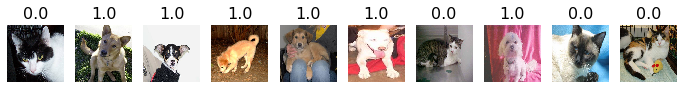

In [50]:
plots(test_imgs,titles=test_labels)

In [51]:
predictions = model.predict_generator(test_batch,steps=1)

In [52]:
import pandas as pd
pred = pd.DataFrame(predictions[:,0])

In [53]:
pred

,0
0,0.536431
1,0.464863
2,0.535956
3,0.540104
4,0.542030
5,0.541866
6,0.462478
7,0.537664
8,0.542098
9,0.488662


In [54]:
pred1 = np.where(pred > 0.5, 1,0)

In [55]:
pred1

array([[1],
       [0],
       [1],
       [1],
       [1],
       [1],
       [0],
       [1],
       [1],
       [0]])

In [57]:
cm = confusion_matrix(test_labels,pred1)
cm

array([[2, 2],
       [1, 5]], dtype=int64)

## Build MobileNet Model

In [58]:
mobile = keras.applications.mobilenet.MobileNet()

In [59]:
mobile.summary()

Model: "mobilenet_1.00_224"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, 225, 225, 3)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32

In [60]:
type(mobile)

keras.engine.training.Model

In [61]:
mobile_model=Sequential()

In [62]:
for layer in mobile.layers:
    mobile_model.add(layer)

In [63]:
mobile_model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1_pad (ZeroPadding2D)    (None, 225, 225, 3)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32)      128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, 112, 112, 32)     

In [64]:
mobile_model._layers.pop()

In [65]:
mobile_model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1_pad (ZeroPadding2D)    (None, 225, 225, 3)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32)      128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, 112, 112, 32)     

In [66]:
for layer in mobile_model.layers:
    layer.trainable=False

In [67]:
mobile_model.add(Dense(units=2,activation='softmax'))

In [68]:
mobile_model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1_pad (ZeroPadding2D)    (None, 225, 225, 3)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32)      128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, 112, 112, 32)     

## Train the MobileNet model

In [69]:
mobile_model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [70]:
mobile_model.fit_generator(train_batch,steps_per_epoch=4,validation_data=test_batch,validation_steps=4,epochs=5)

Epoch 1/5
4/4 [==============================] - 14s 4s/step - loss: 0.6906 - accuracy: 0.6750 - val_loss: 0.6942 - val_accuracy: 0.5250
Epoch 2/5
4/4 [==============================] - 11s 3s/step - loss: 0.6855 - accuracy: 0.6750 - val_loss: 0.7000 - val_accuracy: 0.4250
Epoch 3/5
4/4 [==============================] - 12s 3s/step - loss: 0.6876 - accuracy: 0.6750 - val_loss: 0.6995 - val_accuracy: 0.5000
Epoch 4/5
4/4 [==============================] - 11s 3s/step - loss: 0.6845 - accuracy: 0.7250 - val_loss: 0.6941 - val_accuracy: 0.4500
Epoch 5/5
4/4 [==============================] - 12s 3s/step - loss: 0.6845 - accuracy: 0.7500 - val_loss: 0.6949 - val_accuracy: 0.5000


## Predict from MobileNet model

In [72]:
test_imgs,test_labels = next(test_batch)

In [73]:
test_labels =test_labels[:,0]

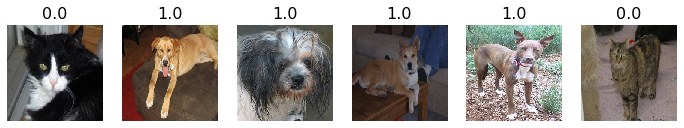

In [74]:
plots(test_imgs,titles=test_labels)

In [75]:
predictions = mobile_model.predict_generator(test_batch,steps=1)

In [76]:
predictions

array([[0.4880121 , 0.51198786],
       [0.4977414 , 0.50225854],
       [0.48437446, 0.51562554],
       [0.48762846, 0.51237154],
       [0.48586887, 0.5141311 ],
       [0.4827443 , 0.51725566]], dtype=float32)

In [77]:
import pandas as pd
pred = pd.DataFrame(predictions[:,0])

In [78]:
pred

,0
0,0.488012
1,0.497741
2,0.484374
3,0.487628
4,0.485869
5,0.482744


In [79]:
pred1 = np.where(pred > 0.5, 1,0)

In [80]:
pred1

array([[0],
       [0],
       [0],
       [0],
       [0],
       [0]])

In [81]:
cm = confusion_matrix(test_labels,pred1)
cm

array([[2, 0],
       [4, 0]], dtype=int64)